# Definizioni iniziali

### Pacchetti

In [30]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

### Matplotlib

In [31]:
def show_image(image, title=None):
    img = image
    if len(img.shape) == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    figure, axes = plt.subplots(figsize=(20, 20))
    axes.imshow(img, cmap='gray', vmin=0, vmax=255)
    axes.set_title(title)
    axes.axis('off')
    plt.show()

def show_horizontal_images(images):
    figure, subplots = plt.subplots(1, len(images), figsize=(20, 20))
    figure.subplots_adjust(wspace=0.01)
    for i, img in enumerate(images):
        subplots[i].imshow(img[0], cmap='gray', vmin=0, vmax=255)
        subplots[i].set_title(img[1])
        subplots[i].axis('off')
    plt.show()

### Allineamento

#### Funzioni di misura

In [32]:
def mutual_information(img1: np.ndarray, img2: np.ndarray, bins: int = 256) -> float:
    """
    Compute the mutual information (MI) between two grayscale images.
    
    :param img1: First image in grayscale.
    :param img2: Second image in grayscale.
    :param bins: Number of histogram bins to use (256 for 8-bit images).
    :return: Mutual information (in bits) between img1 and img2.
    """
    # Convert images to 1D numpy arrays (flatten) if they are not already
    img1 = img1.ravel()
    img2 = img2.ravel()

    # Compute the joint histogram
    # histogram2d returns the 2D histogram and bin edges
    joint_hist, x_edges, y_edges = np.histogram2d(img1, img2, bins=bins)
    
    # Normalize the joint histogram to get the joint PDF p(x,y)
    joint_pdf = joint_hist / np.sum(joint_hist)
    
    # Compute the marginal PDFs p(x) and p(y)
    p_x = np.sum(joint_pdf, axis=1)  # Sum over columns -> marginal over x
    p_y = np.sum(joint_pdf, axis=0)  # Sum over rows -> marginal over y

    # Only consider non-zero values to avoid log(0)
    # MI = sum p(x,y)*log( p(x,y)/(p(x)*p(y)) )
    non_zero_idxs = joint_pdf > 0
    mi = np.sum(joint_pdf[non_zero_idxs] * 
                np.log2(joint_pdf[non_zero_idxs] / 
                        (p_x[np.newaxis].T @ p_y[np.newaxis])[non_zero_idxs]))
    
    return mi

def calculate_mse(img1, img2) -> float:
    """
    Compute the mean squared error (MSE) between two images.
    
    :param img1: First image.
    :param img2: Second image.
    :return: Mean squared error between img1 and img2.
    """
    # Compute the squared error between the two images
    se = (img1 - img2) ** 2
    
    # Compute the mean squared error
    mse = np.mean(se)
    
    return mse

#### Filtri

In [33]:
FILTER_DISTANCE = 20
LOWES_RATIO = 0.75

def filter_LR(matches, threshold=LOWES_RATIO):
    filtered_matches = []
    for m in matches:
        if m[0].distance < threshold * m[1].distance:
            filtered_matches.append(m[0])
    return filtered_matches

def filter_ED(matches, keypoints, distance=FILTER_DISTANCE):
    filtered_matches = []
    for m in matches:
        euclidean_distance = np.linalg.norm(np.array(keypoints[0][m.queryIdx].pt) - np.array(keypoints[1][m.trainIdx].pt))
        if euclidean_distance < distance:
            filtered_matches.append(m)
    return filtered_matches

# Confronti senza maschera e con maschera

#### Senza maschera

ORIGINAL - MI: 0.5418135203016947 - MSE: 99.07692836
ALIGNED  - MI: 1.0081512310230547 - MSE: 99.25625368
Initial matches: 3358 - Final matches: 504


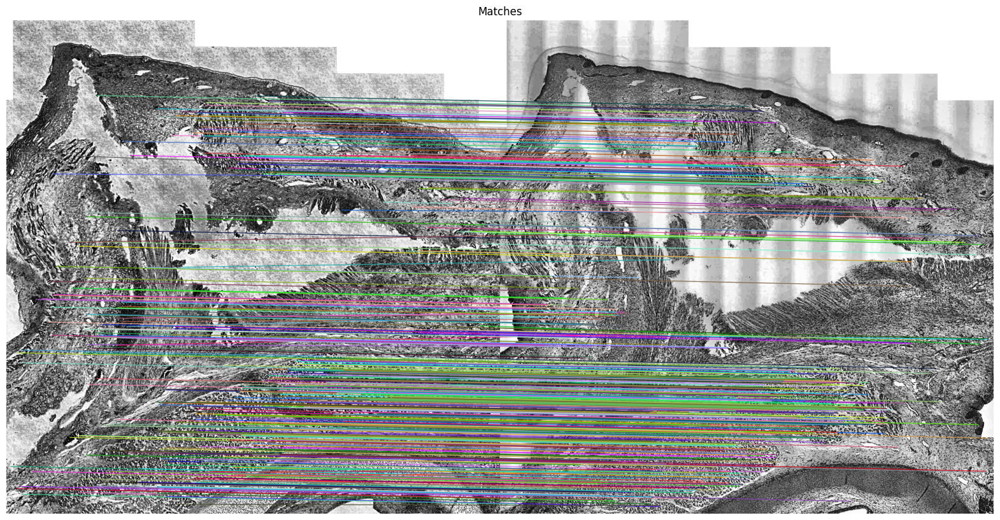

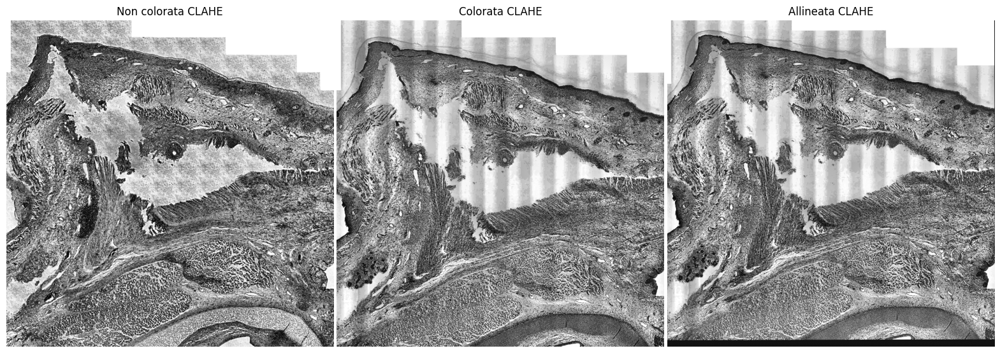

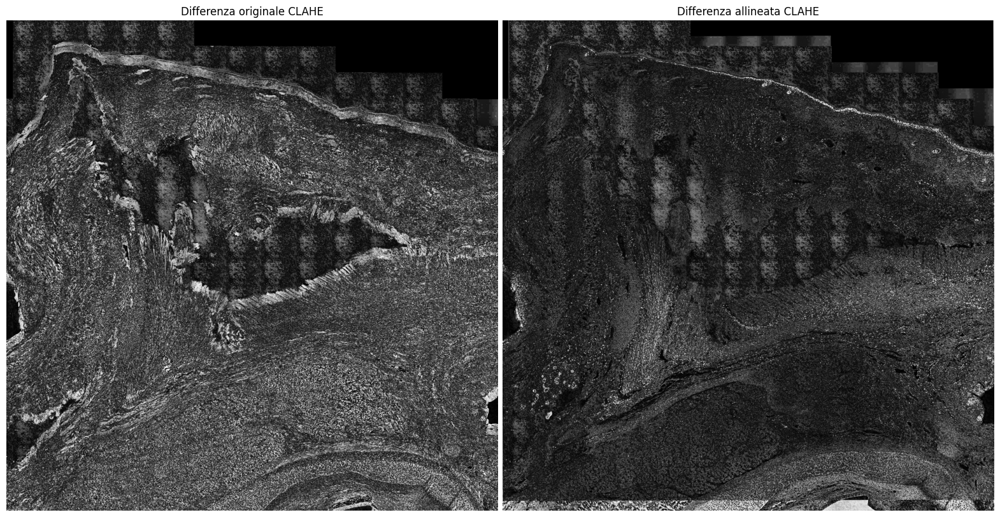

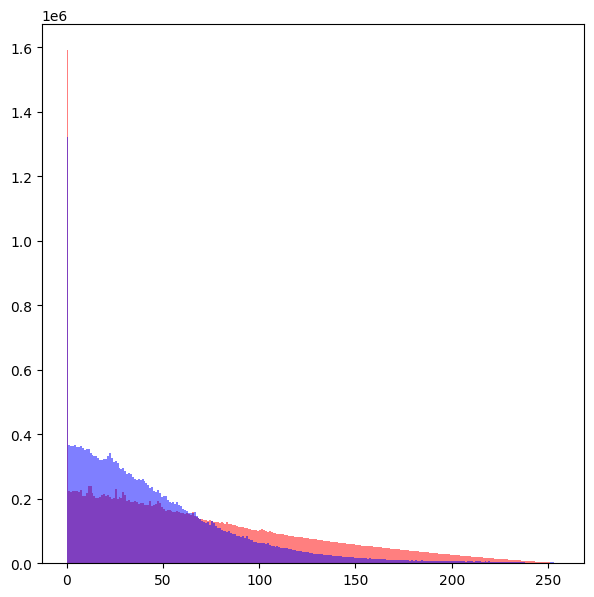

In [34]:
portion = (0, 5000, 7500, 12500)
label_free = cv2.cvtColor(
    cv2.imread("../../Materiale/Locale/fullsize_label_free.tif")[portion[0]:portion[1], portion[2]:portion[3]],
    cv2.COLOR_BGR2GRAY)
stained = cv2.cvtColor(
    cv2.imread("../../Materiale/Locale/fullsize_stained.tif")[portion[0]:portion[1], portion[2]:portion[3]],
    cv2.COLOR_BGR2GRAY)

clahe = cv2.createCLAHE(clipLimit=18.0, tileGridSize=(8, 8))
label_free_clahe = clahe.apply(label_free)
stained_clahe = clahe.apply(stained)

# Detect keypoints and compute descriptors using SIFT
sift = cv2.SIFT_create(nfeatures=10000)
keypoints_1, descriptors_1 = sift.detectAndCompute(label_free_clahe, None)
keypoints_2, descriptors_2 = sift.detectAndCompute(stained_clahe, None)

# Match descriptors using bruteforce not using Lowe's Ratio
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
matches = bf.match(descriptors_1, descriptors_2)

# Filter using Euclidean Distance
filtered_matches = filter_ED(matches, (keypoints_1, keypoints_2), distance=200)

# Extract points from matches for RANSAC
points = ([], [])
for match in filtered_matches:
    points[0].append(keypoints_1[match.queryIdx].pt)
    points[1].append(keypoints_2[match.trainIdx].pt)

points_1 = np.array(points[0])
points_2 = np.array(points[1])
warp_matrix, mask = cv2.estimateAffine2D(points_2, points_1)

# Apply the warp matrix to the image to align
height, width = stained.shape[:2]
aligned_image = cv2.warpAffine(stained, warp_matrix, (width, height))
aligned_clahe = clahe.apply(aligned_image)
mi = mutual_information(label_free, aligned_image)
mse = calculate_mse(label_free_clahe, aligned_clahe)

difference_original_masked = cv2.absdiff(label_free_clahe, stained_clahe)
difference_aligned_masked = cv2.absdiff(label_free, aligned_image)
difference_aligned_clahe_masked = cv2.absdiff(label_free_clahe, aligned_clahe)

draw_matches = cv2.drawMatches(
    label_free_clahe, keypoints_1,
    stained_clahe, keypoints_2,
    filtered_matches, None,
    flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS, matchesThickness=5)

original_mi = mutual_information(label_free, stained)
original_mse = calculate_mse(label_free_clahe, stained_clahe)
print(f"ORIGINAL - MI: {original_mi} - MSE: {original_mse}")
print(f"ALIGNED  - MI: {mi} - MSE: {mse}")

print(f"Initial matches: {len(matches)} - Final matches: {len(filtered_matches)}")
show_image(draw_matches, "Matches")

show_horizontal_images([(label_free_clahe, "Non colorata CLAHE"), (stained_clahe, "Colorata CLAHE"), (aligned_clahe, "Allineata CLAHE")])
show_horizontal_images([(difference_original_masked, "Differenza originale CLAHE"), (difference_aligned_clahe_masked, "Differenza allineata CLAHE")])

plt.figure(figsize=(7, 7))
plt.hist(difference_original_masked.ravel(), bins=256, range=(0, 256), color='red', alpha=0.50)
plt.hist(difference_aligned_clahe_masked.ravel(), bins=256, range=(0, 256), color='blue', alpha=0.50)
plt.show()

#### Con maschera

ORIGINAL - MI: 0.5418135203016947 - MSE: 83.83939332
ALIGNED  - MI: 1.003863367824802 - MSE: 82.72925932
Initial matches: 2499 - Final matches: 272


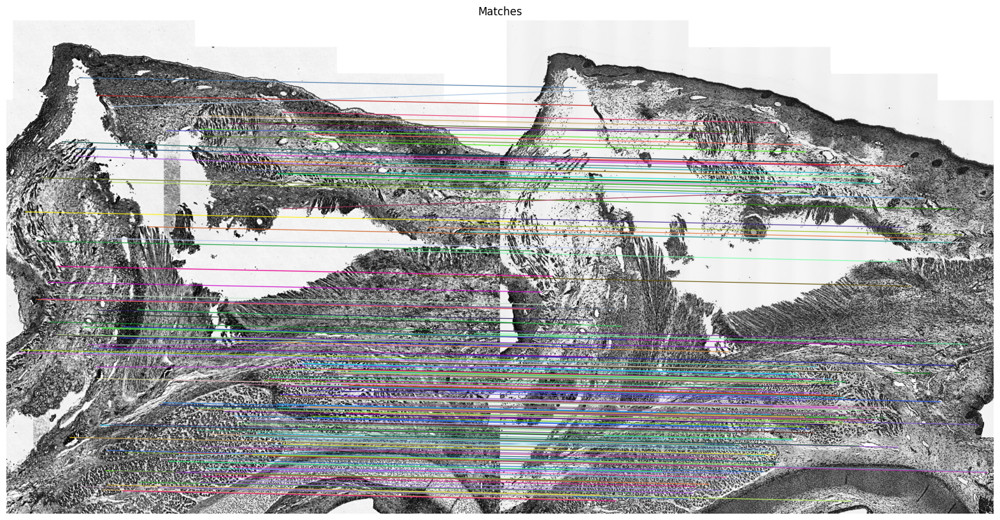

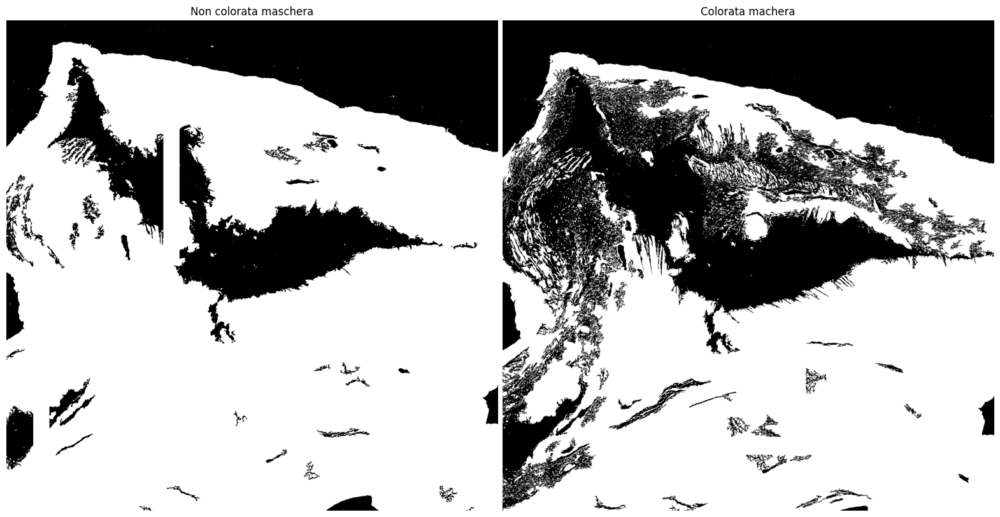

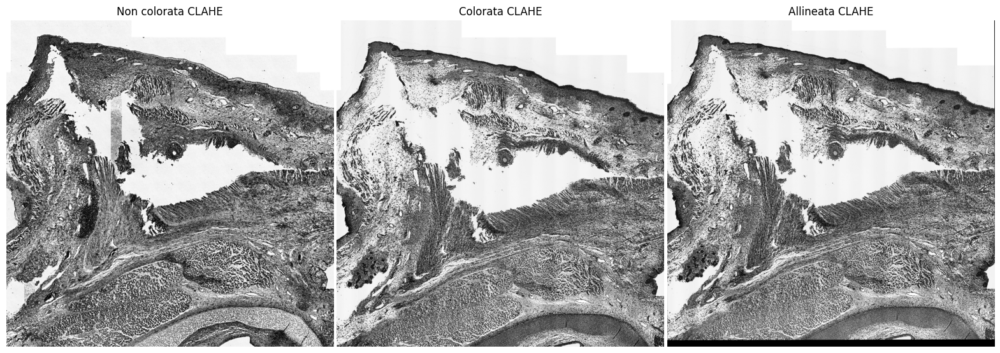

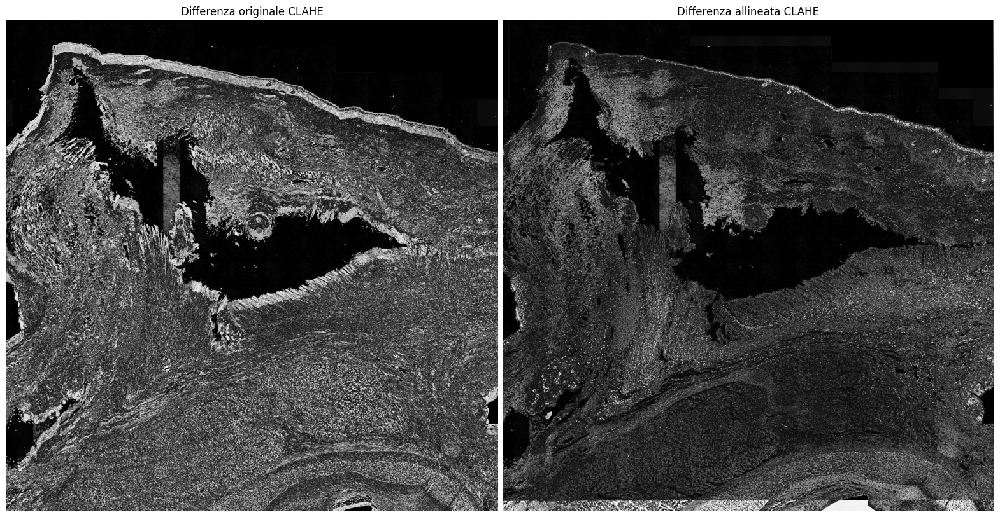

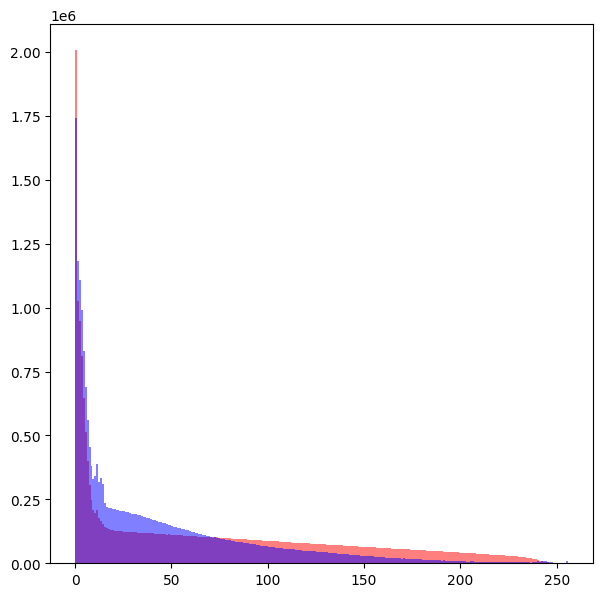

In [35]:
portion = (0, 5000, 7500, 12500)
label_free = cv2.cvtColor(
    cv2.imread("../../Materiale/Locale/fullsize_label_free.tif")[portion[0]:portion[1], portion[2]:portion[3]],
    cv2.COLOR_BGR2GRAY)
mask_lf = cv2.imread("../../Materiale/Immagini/mask_label_free.tif", cv2.IMREAD_GRAYSCALE)[portion[0]:portion[1], portion[2]:portion[3]]
stained = cv2.cvtColor(
    cv2.imread("../../Materiale/Locale/fullsize_stained.tif")[portion[0]:portion[1], portion[2]:portion[3]],
    cv2.COLOR_BGR2GRAY)
mask_st = cv2.imread("../../Materiale/Immagini/mask_stained.tif", cv2.IMREAD_GRAYSCALE)[portion[0]:portion[1], portion[2]:portion[3]]

clahe = cv2.createCLAHE(clipLimit=18.0, tileGridSize=(8, 8))
label_free_clahe = clahe.apply(label_free)
label_free_clahe_masked = np.where(mask_lf == 0, label_free, label_free_clahe)
stained_clahe = clahe.apply(stained)
stained_clahe_masked = np.where(mask_st == 0, stained, stained_clahe)

# Detect keypoints and compute descriptors using SIFT
sift = cv2.SIFT_create(nfeatures=10000)
keypoints_1, descriptors_1 = sift.detectAndCompute(label_free_clahe_masked, mask=mask_lf)
keypoints_2, descriptors_2 = sift.detectAndCompute(stained_clahe_masked, mask=mask_st)

# Match descriptors using bruteforce not using Lowe's Ratio
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
matches = bf.match(descriptors_1, descriptors_2)

# Filter using Euclidean Distance
filtered_matches = filter_ED(matches, (keypoints_1, keypoints_2), distance=200)

# Extract points from matches for RANSAC
points = ([], [])
for match in filtered_matches:
    points[0].append(keypoints_1[match.queryIdx].pt)
    points[1].append(keypoints_2[match.trainIdx].pt)

points_1 = np.array(points[0])
points_2 = np.array(points[1])
warp_matrix, mask = cv2.estimateAffine2D(points_2, points_1)

# Apply the warp matrix to the image to align
height, width = stained.shape[:2]
aligned_image = cv2.warpAffine(stained, warp_matrix, (width, height))
aligned_mask = cv2.warpAffine(mask_st, warp_matrix, (width, height))
aligned_clahe = clahe.apply(aligned_image)
aligned_clahe_masked = np.where(aligned_mask == 0, aligned_image, aligned_clahe)
mi = mutual_information(label_free, aligned_image)
mse = calculate_mse(label_free_clahe_masked, aligned_clahe_masked)

difference_original_masked = cv2.absdiff(label_free_clahe_masked, stained_clahe_masked)
difference_aligned_masked = cv2.absdiff(label_free, aligned_image)
difference_aligned_clahe_masked = cv2.absdiff(label_free_clahe_masked, aligned_clahe_masked)

draw_matches = cv2.drawMatches(
    label_free_clahe_masked, keypoints_1,
    stained_clahe_masked, keypoints_2,
    filtered_matches, None,
    flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS, matchesThickness=5)

original_mi = mutual_information(label_free, stained)
original_mse = calculate_mse(label_free_clahe_masked, stained_clahe_masked)
print(f"ORIGINAL - MI: {original_mi} - MSE: {original_mse}")
print(f"ALIGNED  - MI: {mi} - MSE: {mse}")

print(f"Initial matches: {len(matches)} - Final matches: {len(filtered_matches)}")
show_image(draw_matches, "Matches")

show_horizontal_images([(mask_lf, "Non colorata maschera"), (mask_st, "Colorata machera")])
show_horizontal_images([(label_free_clahe_masked, "Non colorata CLAHE"), (stained_clahe_masked, "Colorata CLAHE"), (aligned_clahe_masked, "Allineata CLAHE")])
show_horizontal_images([(difference_original_masked, "Differenza originale CLAHE"), (difference_aligned_clahe_masked, "Differenza allineata CLAHE")])

plt.figure(figsize=(7, 7))
plt.hist(difference_original_masked.ravel(), bins=256, range=(0, 256), color='red', alpha=0.50)
plt.hist(difference_aligned_clahe_masked.ravel(), bins=256, range=(0, 256), color='blue', alpha=0.50)
plt.show()

#### Confronto